### First, we will load the modules and inference data, define some settings, and perform a small amount of preprocessing

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

In [2]:
db_ = pd.read_csv(os.path.join(path, 'data', 'external_datasets', 'Id25c03_1merNCLB.txt'), sep=' ', header=None)
db_['idx'] = db_[0] + '_' + db_[1]
db_.loc[db_['idx'].duplicated(keep='last')]

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,idx
2011,2K7J,AA29E,0.41,10,0,0,1,NMRl,0.0,1,...,AEHTQAEGK,5.5,28.0,0.4,40.7,91095,10884358,Urea,Acylphophatase-1,2K7J_AA29E
2012,2K7J,GA31A,1.74,10,0,0,1,NMRl,0.0,1,...,GAQAEGKKL,5.5,28.0,0.02,1.9,91096,10884358,Urea,Acylphophatase-1,2K7J_GA31A


<Axes: >

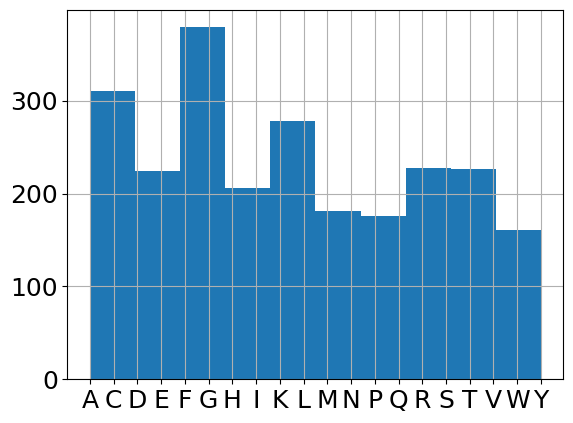

In [3]:
db.sort_values('mutation')['mutation'].hist()

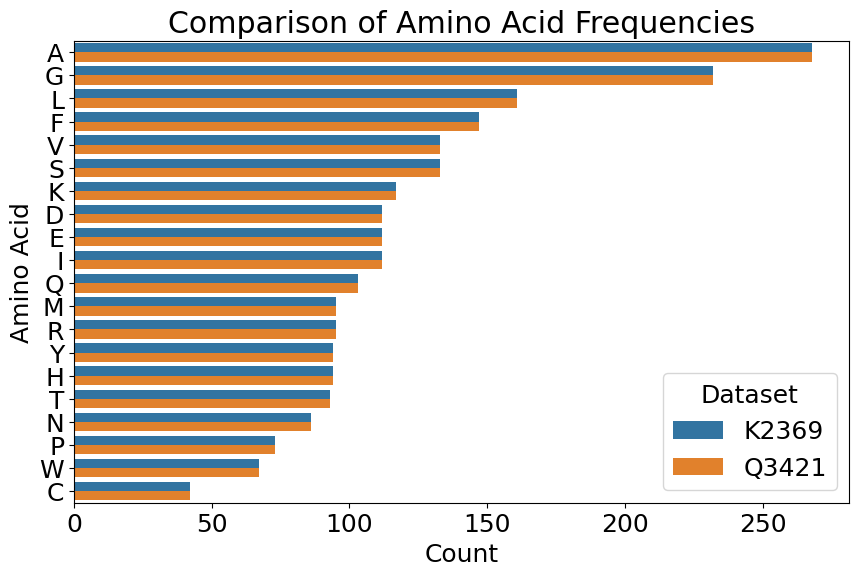

In [4]:
import importlib
importlib.reload(analysis_utils)
db2 = pd.read_csv(preds_loc.replace('korpm', 'q3421')).set_index(['uid', 'uid2'])
analysis_utils.plot_joint_histogram(db, db2, 'mutation')

Original unique mutations: 2369
['esmif_multimer_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'ankh_dir', 'tranception_dir', 'korpm_dir', 'tranception_weights_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'cartesian_ddg_dir']
['esmif_multimer_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'ankh_dir', 'tranception_dir', 'korpm_dir', 'tranception_weights_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'cartesian_ddg_dir']
Detected 40 interface mutations


,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,msa_4_dir,msa_5_dir,msa_transformer_median_dir,msa_transformer_mean_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-10.368763,-10.461415,-10.673284,-10.676060,-10.880333,-0.36,77,-12.229596,0.415640,-0.36
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-9.136351,-7.863315,-8.871069,-8.594967,-1.567467,-1.80,52,0.315755,-0.472625,-1.80
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-8.188882,-6.276230,-7.518724,-7.353611,0.794333,-1.10,52,0.204184,-1.499591,-1.10
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,-9.008335,-7.106450,-7.715471,-7.994566,1.773667,-4.60,52,3.900953,-0.734411,-4.60
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-7.546718,-4.225801,-5.910285,-4.737221,-2.198333,-5.20,52,-1.281482,-1.887776,-5.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,-6.236662,-6.274638,-6.245655,-6.258409,-1.762667,0.39,3,0.342910,0.413368,0.39
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,2.145776,-1.652052,-0.856210,-0.356228,-6.325333,0.80,20,-9.995053,-0.802820,0.80
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-11.434031,-10.226188,-10.325906,-10.967064,-3.867000,-0.97,21,-1.858303,-0.716231,-0.97


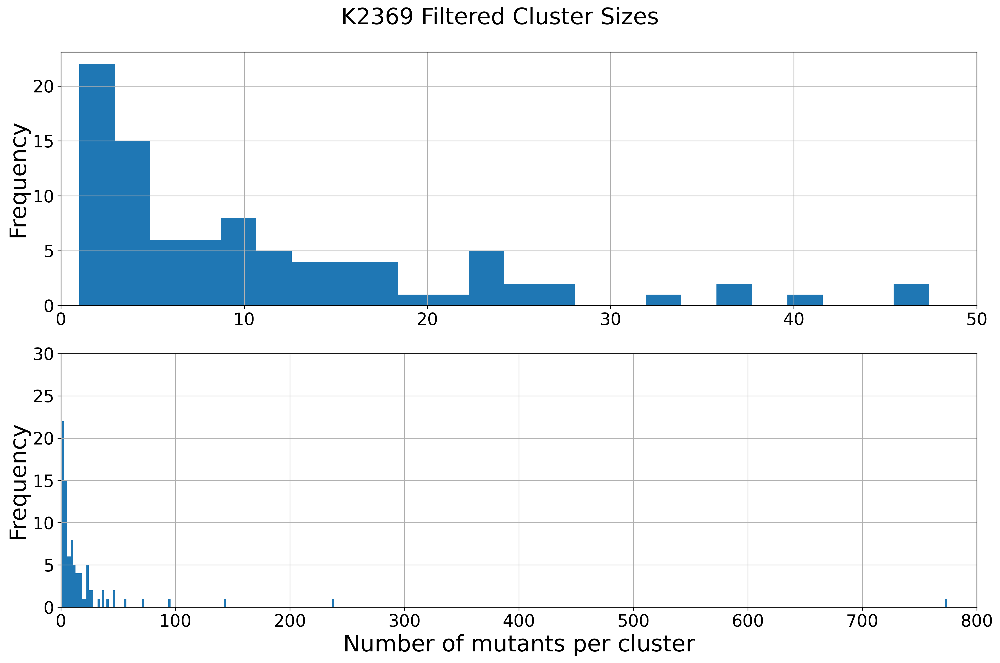

In [5]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro', 'q3421']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

db_class_rescaled = db_class.copy(deep=True)
db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50])  # Set x-axis limits for the first plot
axes[0].tick_params(axis='x', labelsize=18)  # Set x-tick label size for the first plot
axes[0].set_ylabel('Frequency', fontsize=24)  # Set y-label for the first plot

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 800]) 
axes[1].set_ylim([0, 30])  # Set x-axis limits for the first plot
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('K2369 Filtered Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

In [6]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

6 91


### Recursive Feature Addition (Figure 3C)

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
esmif_multimer_dir
ankh_dir
msa_transformer_mean_dir


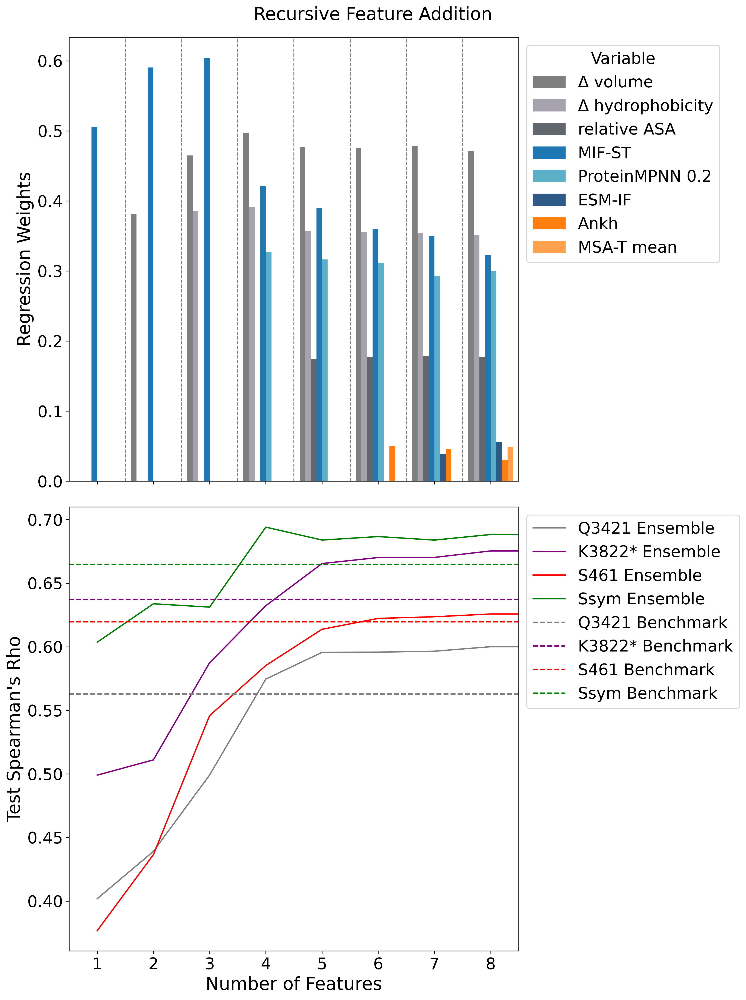

In [7]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir'] #'mutcomputex_dir',
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_korpm']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_pslm' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_pslm' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]

df_test_korpm = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_korpm = df_test_korpm[[c for c in df_test_korpm.columns if not 'K1566_pslm' in c]]
df_test_korpm.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_korpm.columns]
df_test_korpm = df_test_korpm.drop(df_train.index)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_pslm' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test_q3421, 'K3822*': df_test_korpm, 's461': df_test_s461, 'ssym': df_test_ssym, 'test': df_test} #

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_pslm')

db_class = db_class[[c for c in db_class.columns if not 'K1566_pslm' in c]]
db_class = db_class.join(df_test[[c for c in df_test.columns if 'rfa_' in c]]).rename(dict(zip([c for c in df_test.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_pslm' in c])), axis=1)

df_test_korpm = dfs_test['K3822*']
df_test_korpm = df_test_korpm.rename(dict(zip([c for c in df_test_korpm.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_korpm.columns if 'K1566_pslm' in c])), axis=1)

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_pslm' in c])), axis=1)
df_test_q3421.to_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_s461.columns if 'K1566_pslm' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

In [8]:
db_class

,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,K1566_pslm_rfa_2_dir,K1566_pslm_rfa_3_dir,K1566_pslm_rfa_4_dir,K1566_pslm_rfa_5_dir,K1566_pslm_rfa_6_dir,K1566_pslm_rfa_7_dir,K1566_pslm_rfa_8_dir,K1566_pslm_rfa_9_dir,K1566_pslm_rfa_10_dir,K1566_pslm_rfa_11_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-0.372052,-0.642978,-0.120629,-0.336641,-0.360260,-0.303840,-0.319618,-0.319618,-0.319618,-0.381625
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-0.747276,-1.153093,-0.481144,-0.598767,-0.644650,-0.655688,-0.662076,-0.662076,-0.662076,-0.617558
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-0.508203,-0.908739,-0.652323,-0.847762,-0.886525,-0.874524,-0.883446,-0.883446,-0.883446,-0.849035
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,-0.860405,-0.238619,0.527572,0.423921,0.443370,0.423905,0.405850,0.405850,0.405850,0.447278
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-0.890157,-0.797934,-0.339489,-0.394402,-0.342602,-0.356374,-0.353200,-0.353200,-0.353200,-0.338479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,1.053140,0.286426,0.580764,0.670827,0.695854,0.688453,0.617150,0.617150,0.617150,0.614567
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,-0.378599,-0.433441,-0.529294,-0.637093,-0.546427,-0.512533,-0.478431,-0.478431,-0.478431,-0.383616
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-2.158026,-2.183060,-1.421066,-1.151588,-1.238494,-1.206809,-1.171316,-1.171316,-1.171316,-1.175461


### Recursive Feature Addition (All Models) (Supplementary Figure 9)

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
msa_transformer_mean_dir
ankh_dir
cartesian_ddg_dir


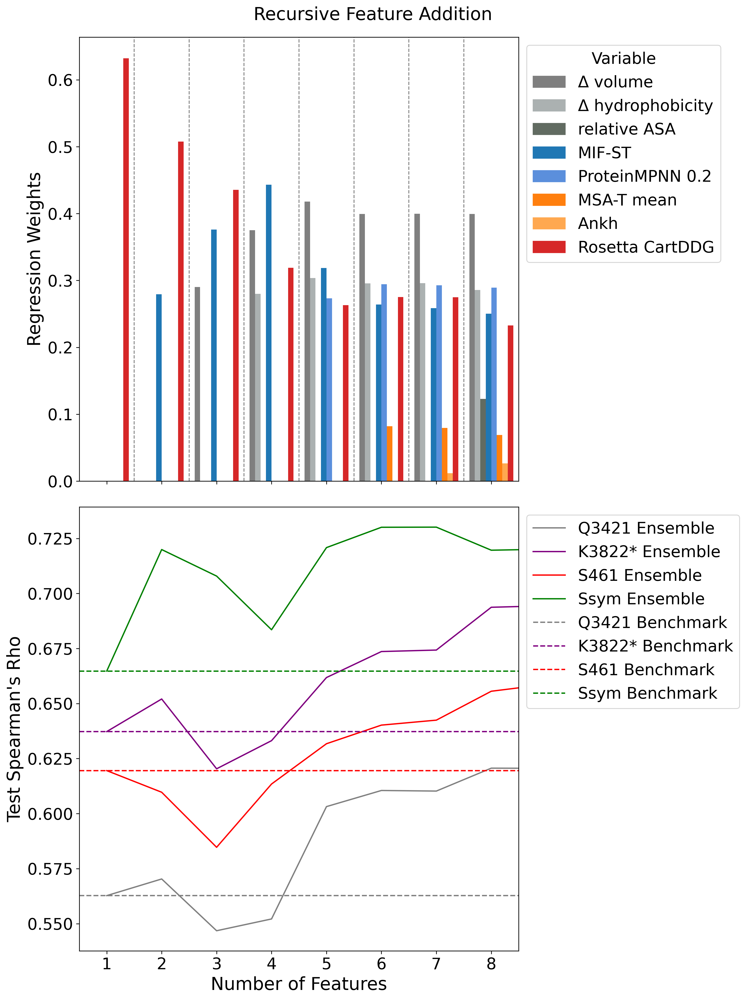

In [9]:
cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'cartesian_ddg_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_korpm']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_all' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]

df_test_korpm = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_korpm = df_test_korpm[[c for c in df_test_korpm.columns if not 'K1566_all' in c]]
df_test_korpm.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_korpm.columns]
df_test_korpm = df_test_korpm.drop(df_train.index)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test_q3421, 'K3822*': df_test_korpm, 's461': df_test_s461, 'ssym': df_test_ssym, 'test': df_test} #

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_all')

db_class = db_class[[c for c in db_class.columns if not 'K1566_all' in c]]
db_class = db_class.join(df_test[[c for c in df_test.columns if 'rfa_' in c]]).rename(dict(zip([c for c in df_test.columns if 'K1566_all' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_all' in c])), axis=1)

In [10]:
drop_cols = [c for c in db_class.columns if 'korpm_pslm' in c and not '5' in c]
drop_cols += [c for c in db_class.columns if 'korpm_all' in c and not '5' in c]
db_class = db_class.drop(drop_cols, axis=1)
db_class

,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,K1566_all_rfa_5_dir,K1566_all_rfa_6_dir,K1566_all_rfa_7_dir,K1566_all_rfa_8_dir,K1566_all_rfa_9_dir,K1566_all_rfa_10_dir,K1566_all_rfa_11_dir,K1566_all_rfa_12_dir,K1566_all_rfa_13_dir,K1566_all_rfa_14_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-0.452413,-0.548982,-0.550817,-0.645364,-0.532167,-0.532167,-0.532167,-0.532167,-0.532167,-0.553100
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-0.358858,-0.376370,-0.386246,-0.498344,-0.630419,-0.630419,-0.630419,-0.630419,-0.630419,-0.642588
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-0.402810,-0.433766,-0.441245,-0.623445,-0.584874,-0.584874,-0.584874,-0.584874,-0.584874,-0.620392
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,0.588300,0.583287,0.588461,0.513022,0.409702,0.409702,0.409702,0.409702,0.409702,0.357497
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-0.318813,-0.279931,-0.268594,-0.300025,-0.288887,-0.288887,-0.288887,-0.288887,-0.288887,-0.330821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,0.471877,0.364316,0.373078,0.473829,0.497281,0.497281,0.497281,0.497281,0.497281,0.504784
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,-0.647766,-0.583141,-0.563144,-0.602151,-0.540977,-0.540977,-0.540977,-0.540977,-0.540977,-0.535820
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-1.270764,-1.264189,-1.286068,-1.146997,-1.122305,-1.122305,-1.122305,-1.122305,-1.122305,-1.125862


In [11]:
import importlib
importlib.reload(analysis_utils)

<module 'analysis_utils' from '/home/sareeves/PSLMs/analysis_notebooks/analysis_utils.py'>

### Non-bootstrapped Analysis of K2369 (not in text)

In [12]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 
                                           'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 
                                           'recall@k1.0', 'aumsc', 'auppc', 'PPV'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
#summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'PPV', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF mean', 'Clustered Ensemble', 'Ensemble 2', 'ProteinMPNN 0.2', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian Noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability_Oracle', 'MutComputeX'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# ~ 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                                  
ΔΔG         unknown      ΔΔG label         2369.0  1.000  1.000  1.000  1.000   
            structural   Rosetta/ProtMPNN  2369.0  0.349  0.748  0.643  0.760   
            biophysical  Rosetta CartDDG   2369.0  0.371  0.706  0.620  0.739   
            potential    KORPM             2369.0  0.382  0.676  0.552  0.733   
            structural   ProteinMPNN 0.3   2369.0  0.266  0.635  0.443  0.740   
                         ProteinMPNN 0.2   2369.0  0.287  0.648  0.449  0.729   
                         MIF               2369.0  0.240  0.622  0.442  0.702   
                         ESM-IF            2369.0  0.244  0.615  0.354  0.708   
                         MIF-ST            2369.0  0.223  0.627  0.447  0.713   
            evolutionary ESM-2 3B          2369.0  0.147  0.548  0.303  0.674   
                         ESM-2 650M        2369.0  0.183  0.554  0.288  0.694   
                         ESM-2 15B         2369.0  0.172  0.573  0.350  0.663   
                         ESM-2 150M        2369.0  0.156  0.525  0.196  0.690   
                         MSA-T 1           2369.0  0.176  0.588  0.355  0.661   
                         MSA-T mean        2369.0  0.173  0.595  0.367  0.674   
                         ESM-1V mean       2369.0  0.161  0.538  0.220  0.667   
                         Ankh              2369.0  0.196  0.577  0.347  0.669   
                         Tranception       2365.0  0.125  0.536  0.324  0.665   
                         ESM-1V 2          2369.0  0.168  0.533  0.211  0.655   
            unknown      Gaussian Noise    2369.0  0.000  0.415 -0.027  0.565   

                                           wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                       
ΔΔG         unknown      ΔΔG label          0.934  1.000     0.963   
            structural   Rosetta/ProtMPNN   0.744  0.547     0.259   
            biophysical  Rosetta CartDDG    0.701  0.487     0.223   
            potential    KORPM              0.679  0.454     0.101   
            structural   ProteinMPNN 0.3    0.679  0.434     0.122   
                         ProteinMPNN 0.2    0.695  0.427     0.150   
                         MIF                0.665  0.423     0.016   
                         ESM-IF             0.654  0.415     0.011   
                         MIF-ST             0.655  0.393     0.012   
            evolutionary ESM-2 3B           0.630  0.297    -0.015   
                         ESM-2 650M         0.622  0.290    -0.048   
                         ESM-2 15B          0.625  0.283    -0.087   
                         ESM-2 150M         0.609  0.278    -0.103   
                         MSA-T 1            0.602  0.273    -0.117   
                         MSA-T mean         0.614  0.268    -0.061   
                         ESM-1V mean        0.608  0.265    -0.205   
                         Ankh               0.618  0.260    -0.198   
                         Tranception        0.600  0.239    -0.143   
                         ESM-1V 2           0.601  0.223    -0.313   
            unknown      Gaussian Noise     0.459 -0.075    -0.764   

                                           Net Stabilization    PPV  \
measurement model_type   model                                        
ΔΔG         unknown      ΔΔG label                   609.758  1.000   
            structural   Rosetta/ProtMPNN            189.523  0.817   
            biophysical  Rosetta CartDDG             182.949  0.731   
            potential    KORPM                       126.098  0.703   
            structural   ProteinMPNN 0.3             102.041  0.696   
                         ProteinMPNN 0.2             114.055  0.732   
                         MIF                          90.488  0.688   
                         ESM-IF                       95.317  0.731   
              

### Bootstrapped KORPM Analysis (Used for Figure 1 and Extended Data Table 1)

In [13]:
import importlib
importlib.reload(analysis_utils)
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'accuracy', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0', 'PPV'),  
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# ~ 15 minutes for 100 bootstraps

mpnn_rosetta
cartesian_ddg
korpm
mpnn_20_00
esm2_650M
random


AUPRC Spearman's ρ Net Stabilization  \
Model Type   Model                                                        
unknown      ΔΔG label              1.00         1.00         629 ± 212   
structural   Rosetta/ProtMPNN       0.75         0.65        189 ± 41.1   
ensemble     Ensemble 4 Feats       0.73         0.65         226 ± 124   
             Ensemble 5 Feats       0.72         0.65         236 ± 133   
             Ensemble 6 Feats       0.72         0.66         239 ± 133   
             Ensemble 7 Feats       0.72         0.66         235 ± 133   
biophysical  Rosetta CartDDG        0.70         0.61        190 ± 85.1   
ensemble     Ensemble 3 Feats       0.70         0.59         226 ± 124   
potential    KORPM                  0.67         0.55        136 ± 89.1   
ensemble     Ensemble 2 Feats       0.66         0.52        151 ± 98.9   
structural   ProteinMPNN 0.2        0.66         0.47        115 ± 43.7   
             ProteinMPNN 0.1        0.65         0.46        112 ± 40.9   
             ProteinMPNN 0.3        0.65         0.47        106 ± 40.6   
             MIF                    0.63         0.46       92.0 ± 32.2   
             MIF-ST                 0.63         0.45        102 ± 28.8   
             ESM-IF                 0.63         0.40       94.1 ± 33.0   
evolutionary MSA-T mean             0.59         0.35       24.0 ± 28.0   
             MSA-T median           0.59         0.35       22.3 ± 27.7   
             Ankh                   0.59         0.36       74.5 ± 27.7   
             ESM-2 15B              0.58         0.36       63.7 ± 20.0   
             ESM-2 650M             0.57         0.32       78.3 ± 33.1   
             ESM-2 3B               0.56         0.32       40.1 ± 27.3   
             ESM-1V mean            0.56         0.26       30.3 ± 35.5   
             ESM-1V median          0.55         0.25       16.9 ± 39.4   
             ESM-2 150M             0.55         0.25      -18.8 ± 68.4   
             Tranception            0.54         0.32       44.5 ± 17.1   
             Tranception (reduced)  0.53         0.30       32.9 ± 14.4   
unknown      Gaussian Noise         0.41         0.01        -431 ± 168   
NaN          Avg. Dev.              0.04         0.06             62.5    

                                      MCC Sensitivity Recall @ k1  
Model Type   Model                                                 
unknown      ΔΔG label               1.00        1.00        1.00  
structural   Rosetta/ProtMPNN        0.36        0.33        0.32  
ensemble     Ensemble 4 Feats        0.42        0.58        0.34  
             Ensemble 5 Feats        0.44        0.60        0.30  
             Ensemble 6 Feats        0.44        0.60        0.29  
             Ensemble 7 Feats        0.44        0.60        0.29  
biophysical  Rosetta CartDDG         0.37        0.45        0.34  
ensemble     Ensemble 3 Feats        0.42        0.58        0.31  
potential    KORPM                   0.39        0.52        0.30  
ensemble     Ensemble 2 Feats        0.35        0.50        0.27  
structural   ProteinMPNN 0.2         0.30        0.32        0.29  
             ProteinMPNN 0.1         0.28        0.29        0.29  
             ProteinMPNN 0.3         0.28        0.33        0.30  
             MIF                     0.26        0.29        0.29  
             MIF-ST                  0.24        0.22        0.25  
             ESM-IF                  0.26        0.24        0.24  
evolutionary MSA-T mean              0.18        0.18        0.16  
             MSA-T median            0.17        0.18        0.15  
             Ankh                    0.21        0.17        0.19  
             ESM-2 15B               0.19        0.15        0.20  
             ESM-2 650M              0.20        0.22        0.23  
             ESM-2 3B                0.17        0.17        0.17  
             ESM-1V mean             0.18        0.22        0.20  
         

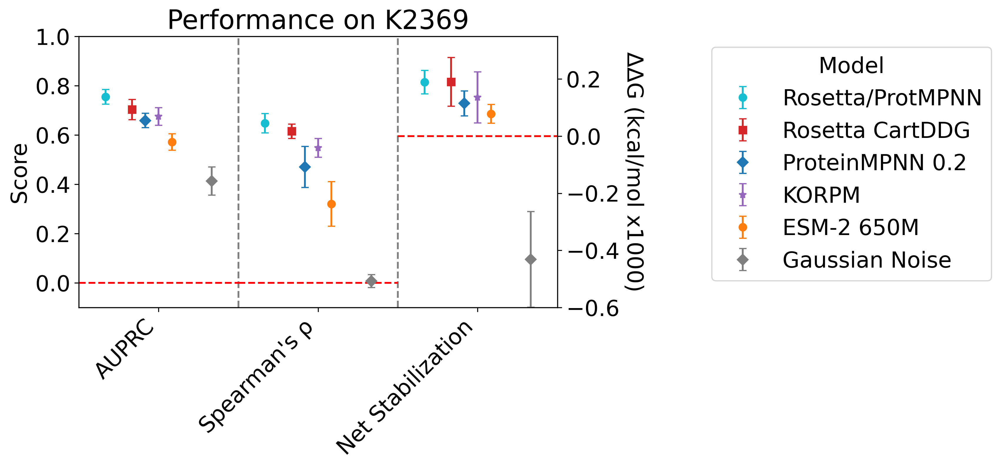

In [ ]:
importlib.reload(analysis_utils)
s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 1)
right_y_lim = (-.600, .350)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0']
saveloc = '../data/extended/k2369_extended_bootstrapped_formatted.csv'
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], 
                sort_col='auprc',
                saveloc=saveloc)

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
mpnn_20_00_dir
mpnn_rosetta_dir
ddG_dir
random_dir


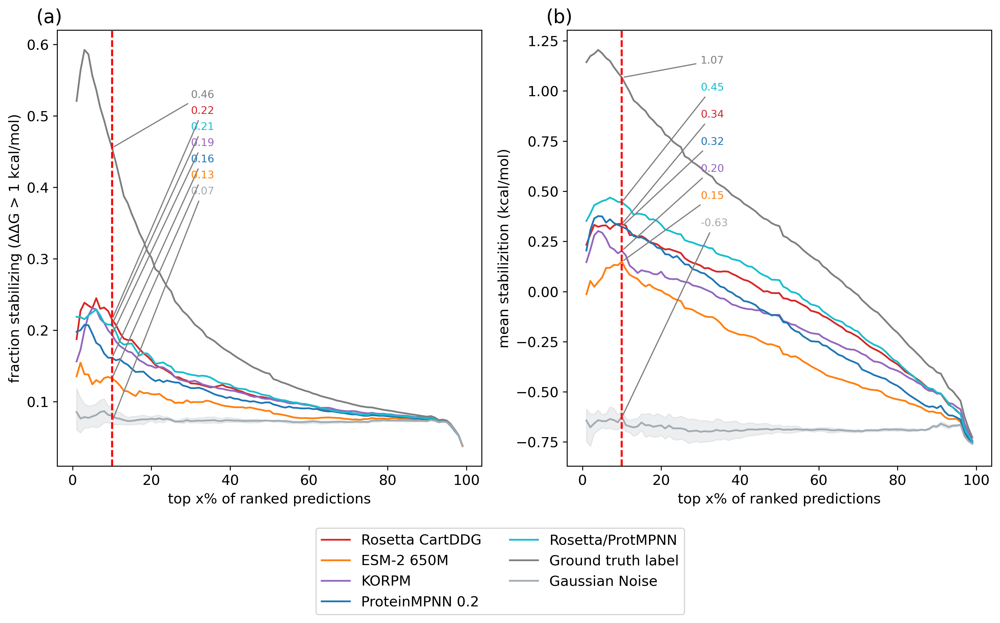

In [ ]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.045, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 'stability-oracle_dir',

# < 4 minutes

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
mpnn_20_00_dir
mpnn_rosetta_dir
ddG_dir
random_dir


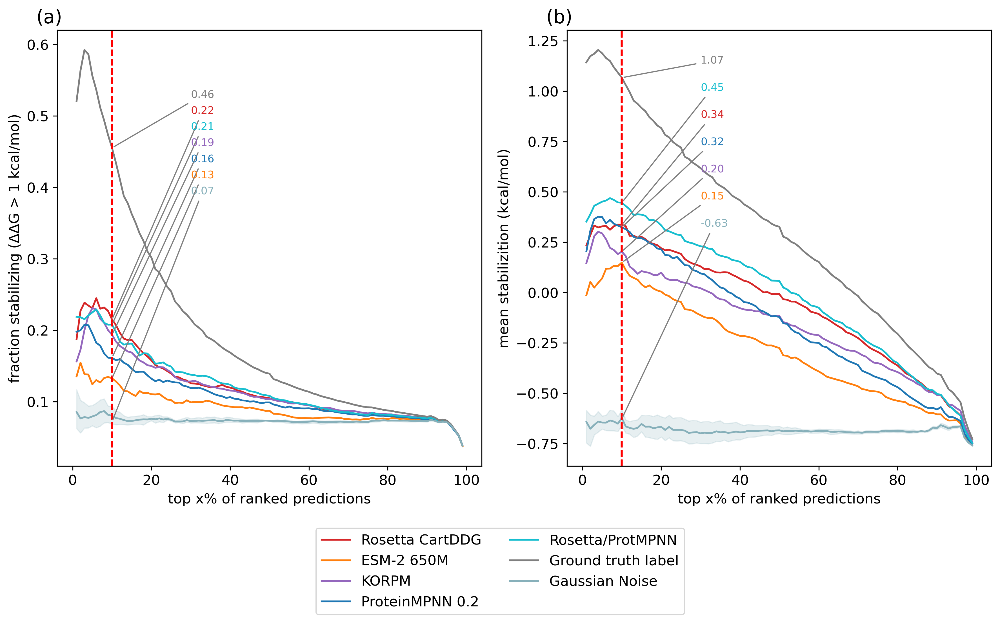

In [ ]:
import importlib
importlib.reload(analysis_utils)
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.045, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 'stability-oracle_dir',


### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

ankh_dir
esm2_650M_dir
msa_transformer_mean_dir
tranception_dir
esmif_multimer_dir
mif_dir
mpnn_20_00_dir
ddG_dir
random_dir


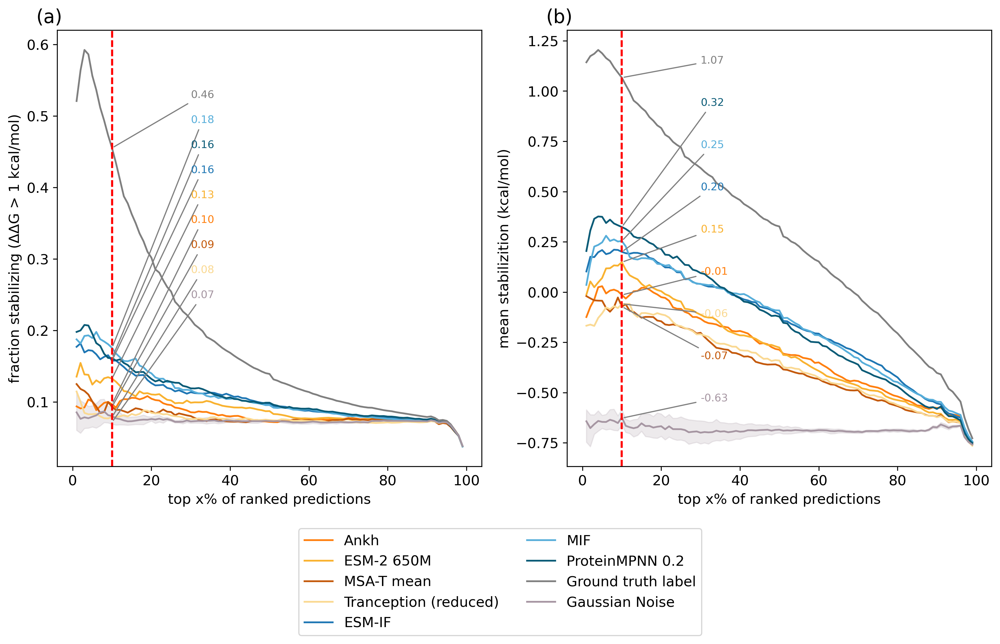

In [ ]:
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Supplementary Table 5

In [ ]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp2 = summ2.reset_index()

# < 1 minute

mpnn_rosetta
cartesian_ddg
esm2_650M
mpnn_20_00
random
korpm


MSE Accuracy Spearman's ρ    wρ  \
Model Type   Model                                                            
structural   Rosetta/ProtMPNN       63.8 ± 10.1     0.73         0.66  0.56   
evolutionary ESM-2 15B              47.7 ± 7.41     0.65         0.37  0.30   
             ESM-2 3B               39.8 ± 7.65     0.64         0.34  0.32   
             MSA-T median           37.7 ± 6.48     0.64         0.37  0.28   
             MSA-T mean             37.5 ± 6.42     0.65         0.37  0.28   
             Ankh                   36.9 ± 6.60     0.66         0.38  0.25   
structural   MIF-ST                 35.7 ± 6.98     0.67         0.45  0.41   
biophysical  Rosetta CartDDG        31.7 ± 4.85     0.72         0.62  0.49   
evolutionary ESM-2 650M             28.5 ± 7.22     0.66         0.35  0.29   
             ESM-1V median          27.4 ± 6.93     0.65         0.28  0.26   
             ESM-1V mean            27.2 ± 6.77     0.65         0.29  0.28   
structural   MIF                    26.7 ± 7.89     0.68         0.50  0.44   
evolutionary ESM-2 150M             20.7 ± 6.84     0.65         0.28  0.29   
structural   ProteinMPNN 0.1        7.47 ± 1.25     0.69         0.49  0.41   
             ProteinMPNN 0.2        6.90 ± 1.33     0.69         0.50  0.44   
             ProteinMPNN 0.3        6.49 ± 1.26     0.69         0.50  0.46   
unknown      Gaussian Noise         3.85 ± 0.78     0.56         0.02  0.01   
evolutionary Tranception            3.41 ± 1.16     0.63         0.33  0.24   
             Tranception (reduced)  3.41 ± 1.16     0.63         0.32  0.23   
structural   ESM-IF                 3.34 ± 1.15     0.68         0.43  0.42   
ensemble     Ensemble 2 Feats       2.20 ± 0.63     0.69         0.52  0.42   
potential    KORPM                  1.93 ± 0.42     0.73         0.56  0.47   
ensemble     Ensemble 3 Feats       1.91 ± 0.51     0.73         0.59  0.44   
             Ensemble 4 Feats       1.77 ± 0.48     0.73         0.65  0.50   
             Ensemble 7 Feats       1.72 ± 0.46     0.73         0.66  0.49   
             Ensemble 5 Feats       1.72 ± 0.45     0.74         0.66  0.50   
             Ensemble 6 Feats       1.71 ± 0.45     0.73         0.66  0.49   
unknown      ΔΔG label              0.00 ± 0.00     1.00         1.00  1.00   
NaN          Avg. Dev.                    3.46      0.04         0.06  0.03   

                                   Net Stabilization  
Model Type   Model                                    
structural   Rosetta/ProtMPNN                    180  
evolutionary ESM-2 15B                          69.2  
             ESM-2 3B                           39.5  
             MSA-T median                       36.2  
             MSA-T mean                         39.7  
             Ankh                               85.7  
structural   MIF-ST                              102  
biophysical  Rosetta CartDDG                     148  
evolutionary ESM-2 650M                         90.2  
             ESM-1V median                      24.2  
             ESM-1V mean                        38.1  
structural   MIF                                84.6  
evolutionary ESM-2 150M                        -36.7  
structural   ProteinMPNN 0.1                     107  
             ProteinMPNN 0.2                    99.3  
             ProteinMPNN 0.3                    92.4  
unknown      Gaussian Noise                     -414  
evolutionary Tranception                        39.3  
             Tranception (reduced)              29.2  
structural   ESM-IF                             98.1  
ensemble     Ensemble 2 Feats                   88.6  
potential    KORPM                              98.7  
ensemble     Ensemble 3 Feats                    155  
             Ensemble 4 Feats                    159  
             Ensemble 7 Feats                    159  
             Ensemble 5 Feats                    159  
             Ensemble 6 Feats                    162  

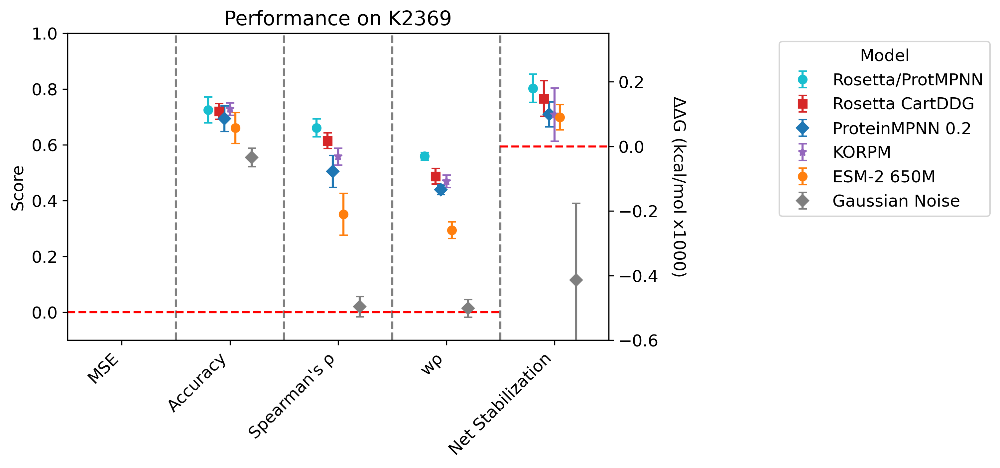

In [ ]:
importlib.reload(analysis_utils)
s2 = tmp2.sort_values('mean_squared_error_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'net_stabilization']
plot_models = ['mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 1)
right_y_lim = (-.600, .350)
table_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'net_stabilization']
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['mean_squared_error'],
                sort_col='mean_squared_error',
                )

### Additional Figure describing correlation between predictions and scores of two selected models

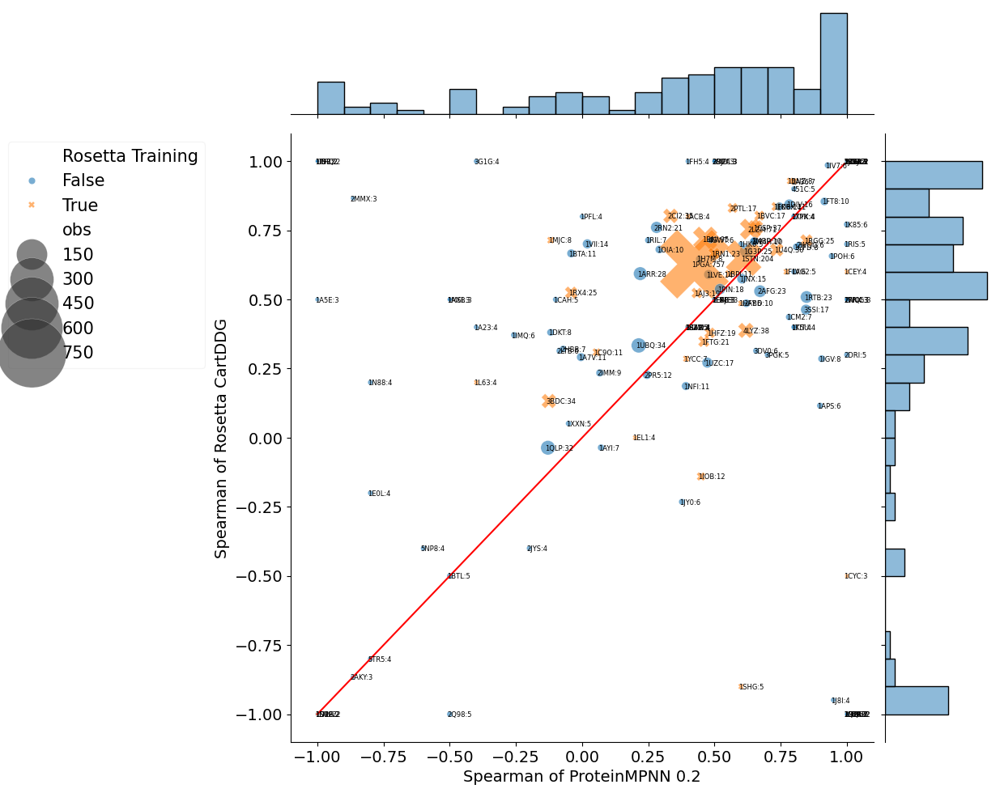

In [ ]:
importlib.reload(analysis_utils)

col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_ = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

### Figure 4 a&b

                   0
0     mpnn_30_00_dir
1     mpnn_20_00_dir
2     mpnn_10_00_dir
3      esm2_150M_dir
4      esm2_650M_dir
5        esm2_3B_dir
6  esm2_15B_half_dir
7            ddG_dir
mpnn_30_00_dir
mpnn_20_00_dir
mpnn_10_00_dir
esm2_150M_dir
esm2_650M_dir
esm2_3B_dir
esm2_15B_half_dir
ddG_dir


[Text(0, 0, 'ProteinMPNN 0.3'),
 Text(1, 0, 'ProteinMPNN 0.2'),
 Text(2, 0, 'ProteinMPNN 0.1'),
 Text(3, 0, 'ESM-2 150M'),
 Text(4, 0, 'ESM-2 650M'),
 Text(5, 0, 'ESM-2 3B'),
 Text(6, 0, 'ESM-2 15B'),
 Text(7, 0, 'ΔΔG label')]

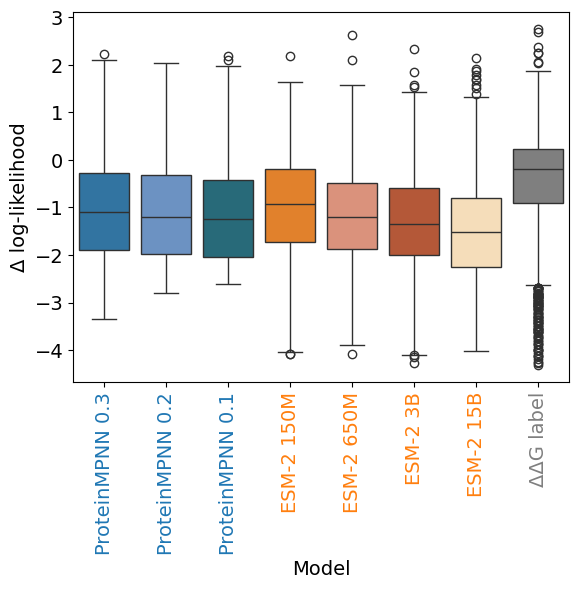

In [ ]:
dbc2 = db_class[['mpnn_30_00_dir', 'mpnn_20_00_dir', 'mpnn_10_00_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'ddG_dir']]
dbc2 /= dbc2.std()
cols = dbc2.columns
db_cols = pd.DataFrame(data=cols)
print(db_cols)
cmap = analysis_utils.get_color_mapping(db_cols, 0)
ax = sns.boxplot(dbc2, palette=cmap)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('Δ log-likelihood')
ax.set_xlabel('Model')
for tick_label in ax.get_xticklabels():
    tick_label.set_color(analysis_utils.determine_base_color(tick_label))
ax.set_xticklabels([remap_names_2.get(str(a).split('\'')[1],str(a).split('\'')[1]) for a in ax.get_xticklabels()])

KeyboardInterrupt: 

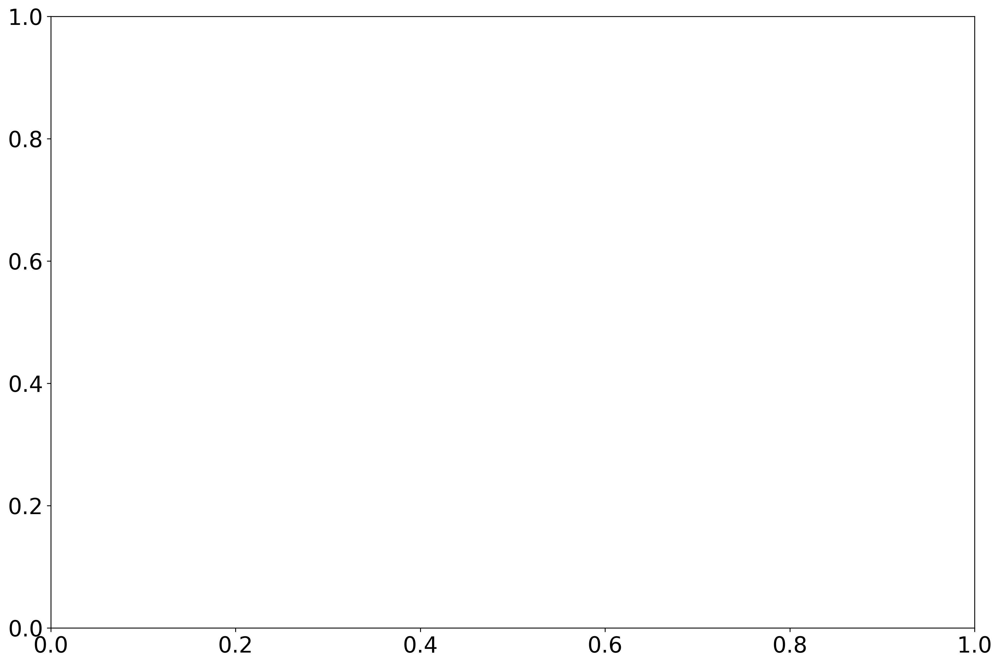

In [ ]:
importlib.reload(analysis_utils)
subset = ['K1566_pslm_rfa_7_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'top',
                        drop_label = True,
                        asterisk = ('KORPM', 'Ensemble 7 Feats')
                        )
model_order
# < 10 seconds

  0%|          | 0/100 [00:00<?, ?it/s]

class
0 >= ΔΔG > -1.5    513
ΔΔG <= -1.5        375
ΔΔG > 0            641
Name: n, dtype: int64


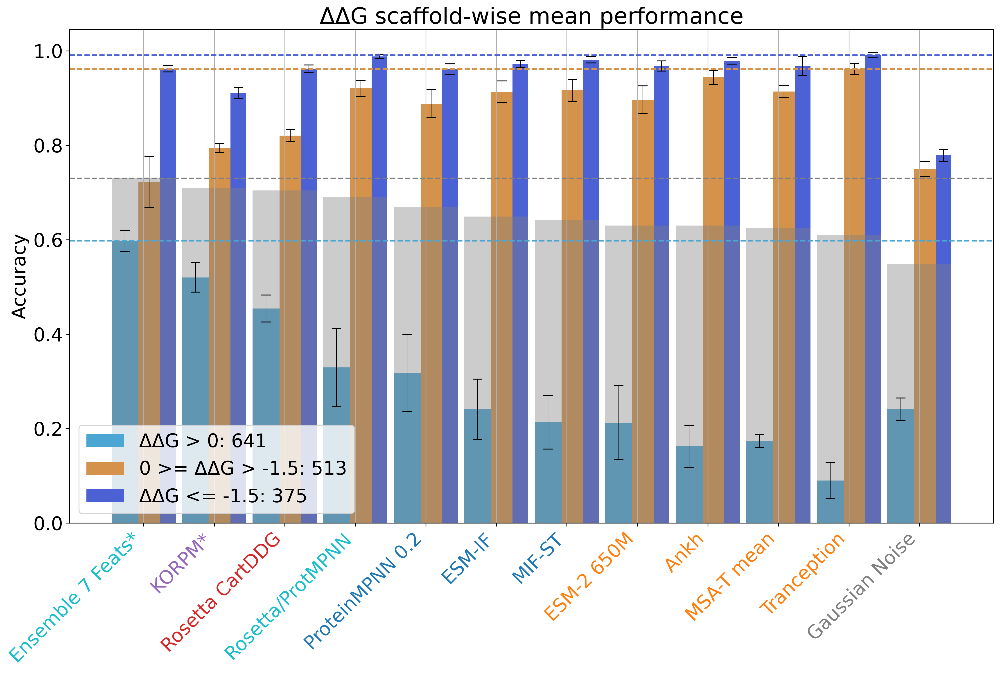

1         K1566_pslm_rfa_7_dir
6                    korpm_dir
0            cartesian_ddg_dir
10            mpnn_rosetta_dir
9               mpnn_20_00_dir
7           esmif_multimer_dir
8                    mifst_dir
3                esm2_650M_dir
2                     ankh_dir
4     msa_transformer_mean_dir
5      tranception_weights_dir
11                  random_dir
Name: model, dtype: object

In [ ]:
importlib.reload(analysis_utils)
subset = ['K1566_pslm_rfa_7_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'accuracy',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 100,
                        #count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'top',
                        drop_label = True,
                        asterisk = ('KORPM', 'Ensemble 7 Feats')
                        )
model_order
# < 10 seconds

  0%|          | 0/1000 [00:00<?, ?it/s]

neff > 100 & conservation > 80% : 97
neff <= 100 & conservation > 80% : 549
neff > 100 & conservation <= 80% : 802
neff <= 100 & conservation <= 80% : 60
class
neff <= 100 & conservation <= 80     60
neff <= 100 & conservation > 80     549
neff > 100 & conservation <= 80     802
neff > 100 & conservation > 80       97
Name: n, dtype: int64


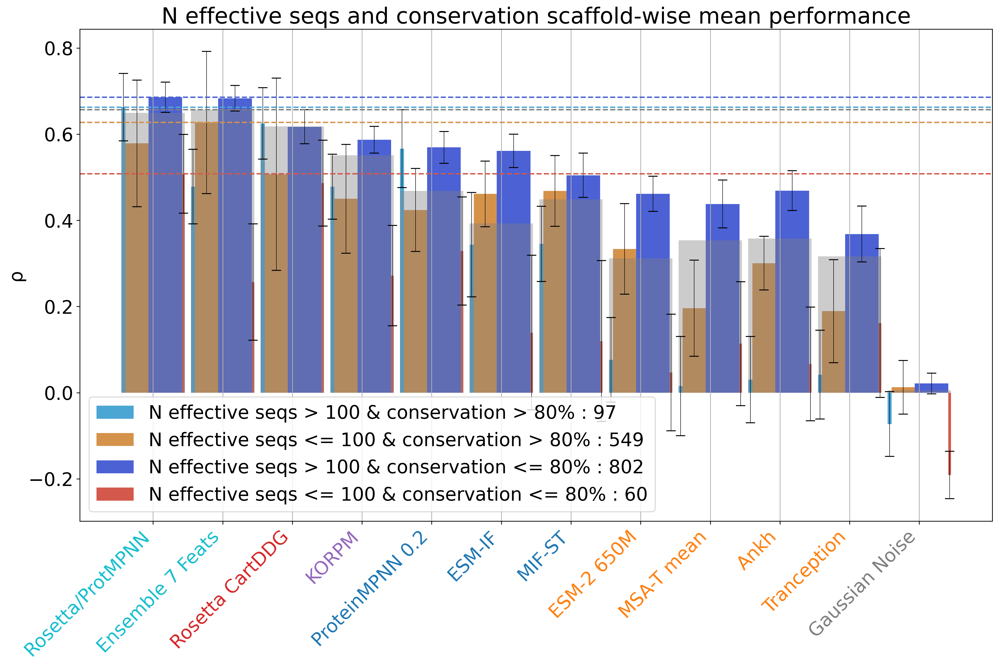

0             mpnn_rosetta_dir
1         K1566_pslm_rfa_7_dir
2            cartesian_ddg_dir
3                    korpm_dir
4               mpnn_20_00_dir
5           esmif_multimer_dir
6                    mifst_dir
7                esm2_650M_dir
8     msa_transformer_mean_dir
9                     ankh_dir
10     tranception_weights_dir
11                  random_dir
Name: model, dtype: object

In [ ]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 100, 
                        threshold_2 = 80, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='top',
                        drop_label = True
                        )

models

### Figure 4 c&d

  0%|          | 0/1000 [00:00<?, ?it/s]

class
neff <= 100    595
neff > 100     897
Name: n, dtype: int64


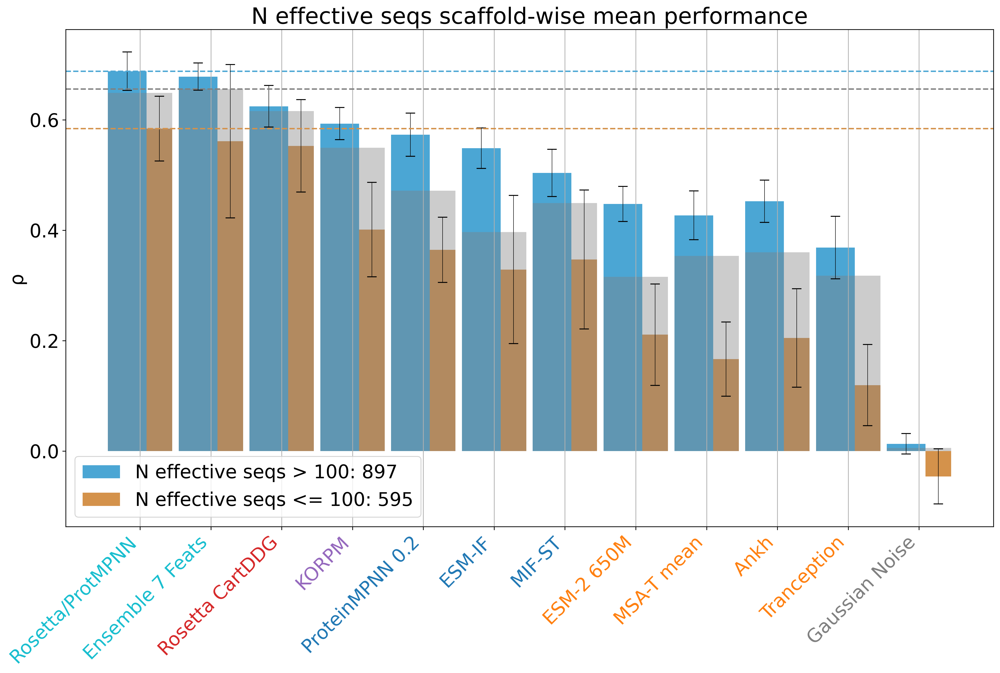

0             mpnn_rosetta_dir
1         K1566_pslm_rfa_7_dir
2            cartesian_ddg_dir
3                    korpm_dir
4               mpnn_20_00_dir
5           esmif_multimer_dir
6                    mifst_dir
7                esm2_650M_dir
8     msa_transformer_mean_dir
9                     ankh_dir
10     tranception_weights_dir
11                  random_dir
Name: model, dtype: object

In [ ]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = None, 
                        threshold_1 = 100, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='top',
                        drop_label = True
                        )

models
# < 10 seconds

  0%|          | 0/1000 [00:00<?, ?it/s]

conservation > 90% : 602
conservation <= 90% : 903
class
conservation <= 90    903
conservation > 90     602
Name: n, dtype: int64


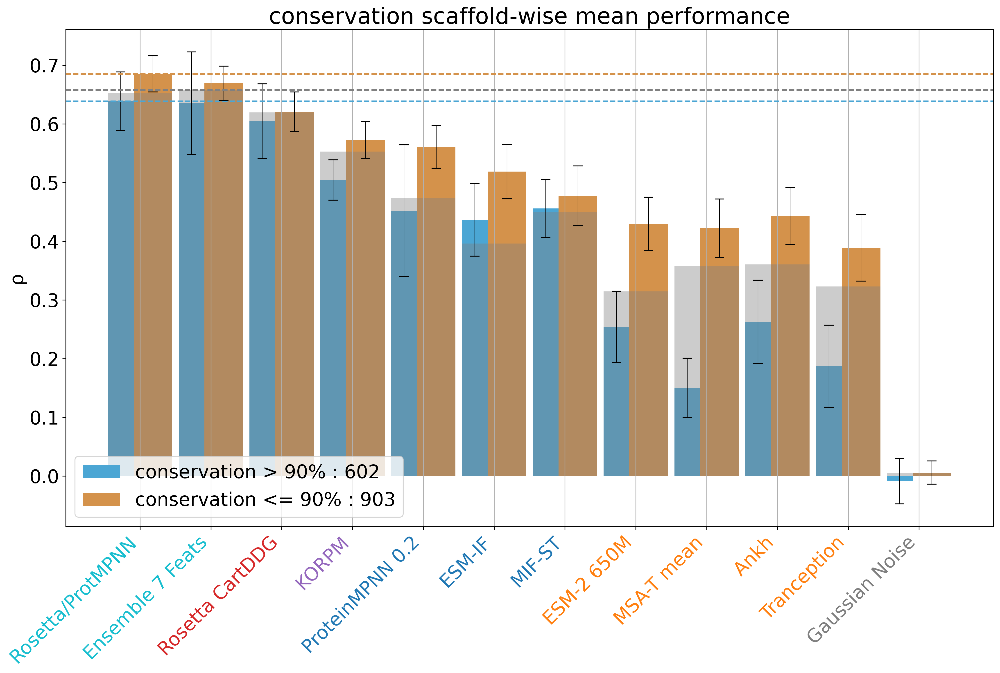

0             mpnn_rosetta_dir
1         K1566_pslm_rfa_7_dir
2            cartesian_ddg_dir
3                    korpm_dir
4               mpnn_20_00_dir
5           esmif_multimer_dir
6                    mifst_dir
7                esm2_650M_dir
8     msa_transformer_mean_dir
9                     ankh_dir
10     tranception_weights_dir
11                  random_dir
Name: model, dtype: object

In [ ]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 90, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='top',
                        drop_label = True
                        )

models
# < 10 seconds

  0%|          | 0/1000 [00:00<?, ?it/s]

['mpnn_rosetta_dir', 'K1566_pslm_rfa_7_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_20_00_dir', 'esmif_multimer_dir', 'mifst_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'ankh_dir', 'tranception_weights_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    291
delta_kdh <= 0 & rel_ASA > 0.2     422
delta_kdh > 0 & rel_ASA <= 0.2     200
delta_kdh > 0 & rel_ASA > 0.2      570
Name: n, dtype: int64


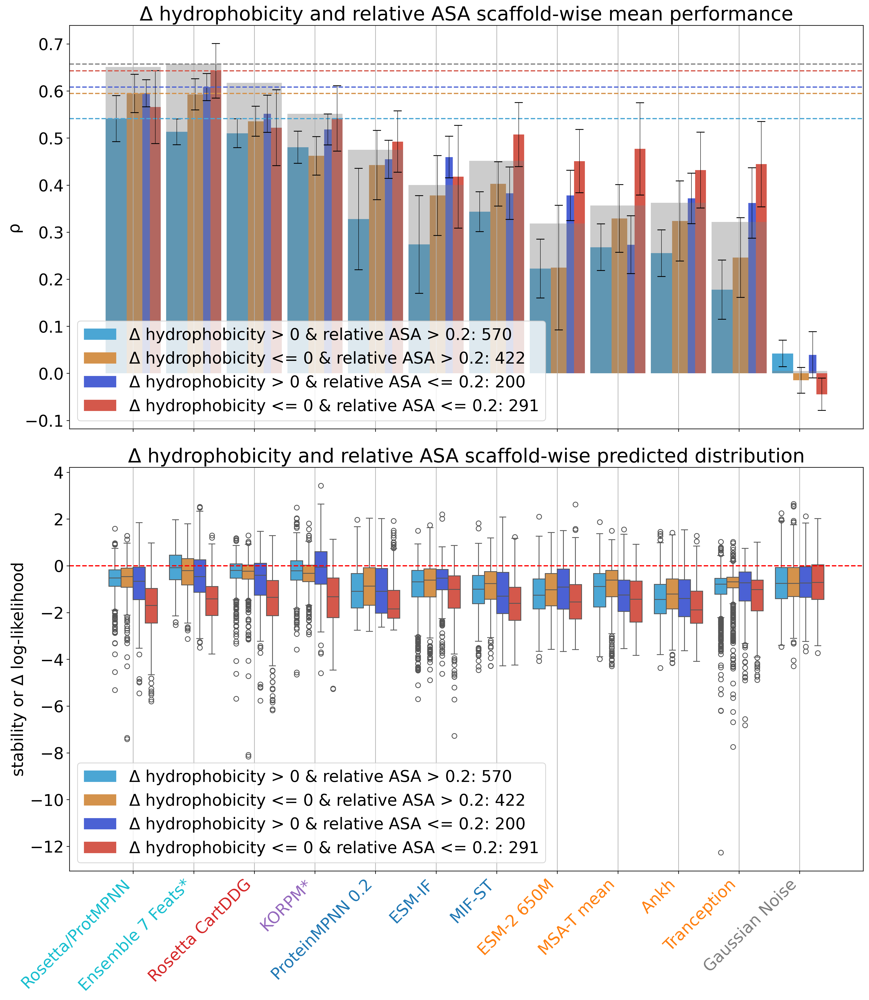

In [ ]:
current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        drop_label=False,
                        asterisk = ('KORPM', 'Ensemble 7 Feats')
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [ ]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,msa_transformer_median_dir,msa_transformer_mean_dir,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-9.977776,-10.283469,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,...,6,0,0,0,0,0,0,0,0,0
1A23_30S,1A23_30S,-8.570910,-8.462356,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,-7.639166,-7.748131,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-5.161361,-5.346782,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,-7.309464,-7.304522,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-3.398228,-3.599832,-0.000270,-1.666809,-1.537109,-0.504931,0.174999,0.143847,-0.197353,-0.914865,...,6,0,0,0,0,0,0,0,0,0
5TR5_37L,5TR5_37L,-5.763228,-5.859906,-0.141229,-3.879099,-4.250977,-2.183522,-2.582745,-1.526459,-7.014242,-4.624759,...,5,0,0,0,0,0,0,0,0,0
5TR5_55I,5TR5_55I,-5.446866,-5.314182,-0.014492,-0.803307,-1.160156,-3.132755,-3.161942,-2.022209,-3.645788,-3.215672,...,6,0,0,0,0,0,0,0,0,0


### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [ ]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_korpm_combinations_3_weights.csv'), overwrite=True)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1541 [00:00<?, ?it/s]

### Pairwise statistics for all model combinations

In [ ]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_korpm_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                        class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5     NaN    0.815412   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5     NaN    0.814331   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5     NaN    0.812132   
            cartesian_ddg_dir + mif_dir * 0.5            NaN    0.805764   
            cartesian_ddg_dir + mifst_dir * 0.5          NaN    0.813378   
            mpnn_20_00_dir + cartesian_ddg_dir * 1       NaN    0.797285   
            cartesian_ddg_dir + mpnn_20_00_dir * 1       NaN    0.797285   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2     NaN    0.820452   
            mpnn_30_00_dir + cartesian_ddg_dir * 1       NaN    0.793036   
            cartesian_ddg_dir + mpnn_30_00_dir * 1       NaN    0.793036   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2     NaN    0.820079   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5 NaN    0.796940   
            mpnn_10_00_dir + cartesian_ddg_dir * 1       NaN    0.796414   
            cartesian_ddg_dir + mpnn_10_00_dir * 1       NaN    0.796414   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.2     NaN    0.818829   
            cartesian_ddg_dir + mif_dir * 1              NaN    0.787762   
            mif_dir + cartesian_ddg_dir * 1              NaN    0.787762   
            esmif_multimer_dir + cartesian_ddg_dir * 1   NaN    0.772962   
            cartesian_ddg_dir + esmif_multimer_dir * 1   NaN    0.772962   
            cartesian_ddg_dir + mifst_dir * 0.2          NaN    0.818398   

                                                                   auprc  \
model_type  model                                        class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5     NaN    0.746187   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5     NaN    0.742796   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5     NaN    0.737459   
            cartesian_ddg_dir + mif_dir * 0.5            NaN    0.732064   
            cartesian_ddg_dir + mifst_dir * 0.5          NaN    0.740761   
            mpnn_20_00_dir + cartesian_ddg_dir * 1       NaN    0.727101   
            cartesian_ddg_dir + mpnn_20_00_dir * 1       NaN    0.727101   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2     NaN    0.741880   
            mpnn_30_00_dir + cartesian_ddg_dir * 1       NaN    0.717287   
            cartesian_ddg_dir + mpnn_30_00_dir * 1       NaN    0.717287   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2     NaN    0.741335   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5 NaN    0.722145   
            mpnn_10_00_dir + cartesian_ddg_dir * 1       NaN    0.722678   
            cartesian_ddg_dir + mpnn_10_00_dir * 1       NaN    0.722678   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.2     NaN    0.737500   
            cartesian_ddg_dir + mif_dir * 1              NaN    0.712881   
            mif_dir + cartesian_ddg_dir * 1              NaN    0.712881   
            esmif_multimer_dir + cartesian_ddg_dir * 1   NaN    0.706453   
            cartesian_ddg_dir + esmif_multimer_dir * 1   NaN    0.706453   
            cartesian_ddg_dir + mifst_dir * 0.2          NaN    0.738106   

                                                                0.0_n_stable  \
model_type  model                                        class                 
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5     NaN           991.0   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5     NaN           991.0   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5     NaN           991.0   
            cartesian_ddg_dir + mif_dir * 0.5            NaN           991.0   
            cartesian_ddg_dir + mifst_dir * 0.5          NaN           991.0   
            mpnn_20_00_dir + cartesian_ddg_dir * 1       NaN           991.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 1       NaN           991.0   
 

### Supplementary Figure 7

2369


  0%|          | 0/10 [00:00<?, ?it/s]

0.06847625415670344
['Rosetta CartDDG', 'KORPM', 'ProteinMPNN 0.2', 'MIF-ST', 'MIF', 'ESM-IF', 'Ankh', 'MSA-T mean', 'ESM-2 650M', 'Tranception', 'ESM-1V mean']


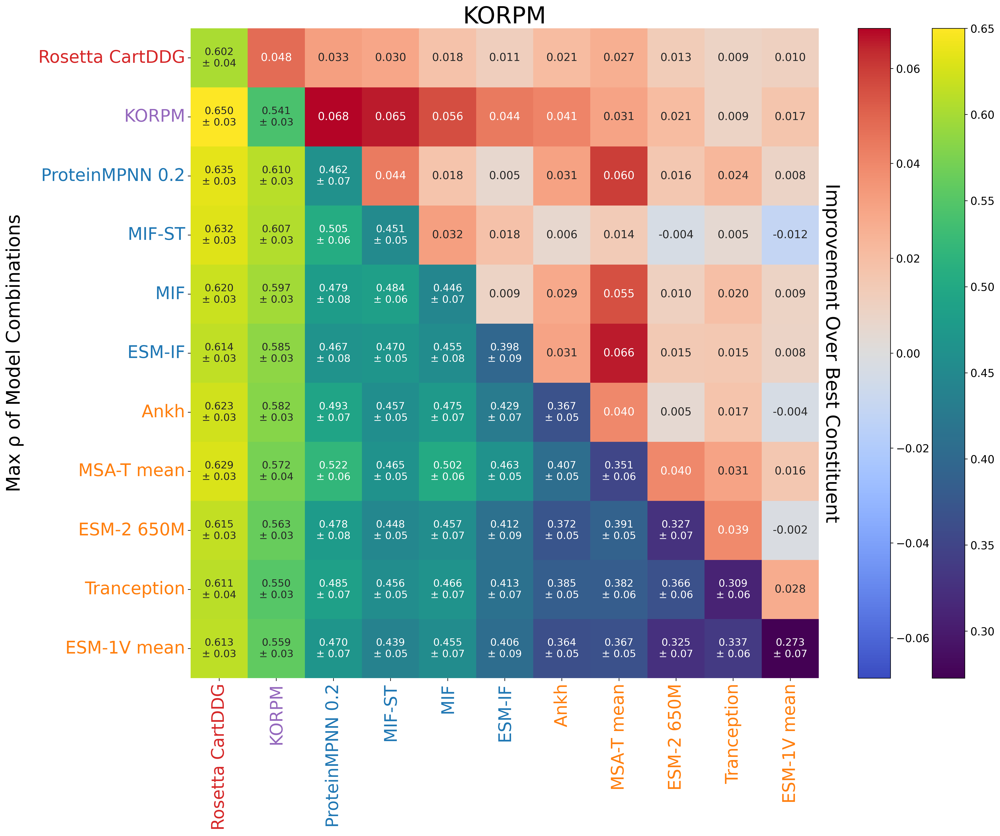

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,korpm_dir,0.5,0.650058,0.0
2,korpm_dir,1,cartesian_ddg_dir,1,0.645571,0.0
3,cartesian_ddg_dir,1,korpm_dir,0.2,0.635169,0.0
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,0.63496,0.000138
5,cartesian_ddg_dir,1,mifst_dir,0.2,0.632144,0.000004


In [ ]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_650M_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=10, upper=upper, subset=subset2, title='KORPM')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df.head()

### Extra Figure (not in text) showing Net Stabilization instead

2369


  0%|          | 0/10 [00:00<?, ?it/s]

70.305
['Rosetta CartDDG', 'KORPM', 'ProteinMPNN 0.2', 'MIF-ST', 'MIF', 'ESM-IF', 'ESM-2 650M', 'Ankh', 'Tranception', 'ESM-1V mean', 'MSA-T mean']


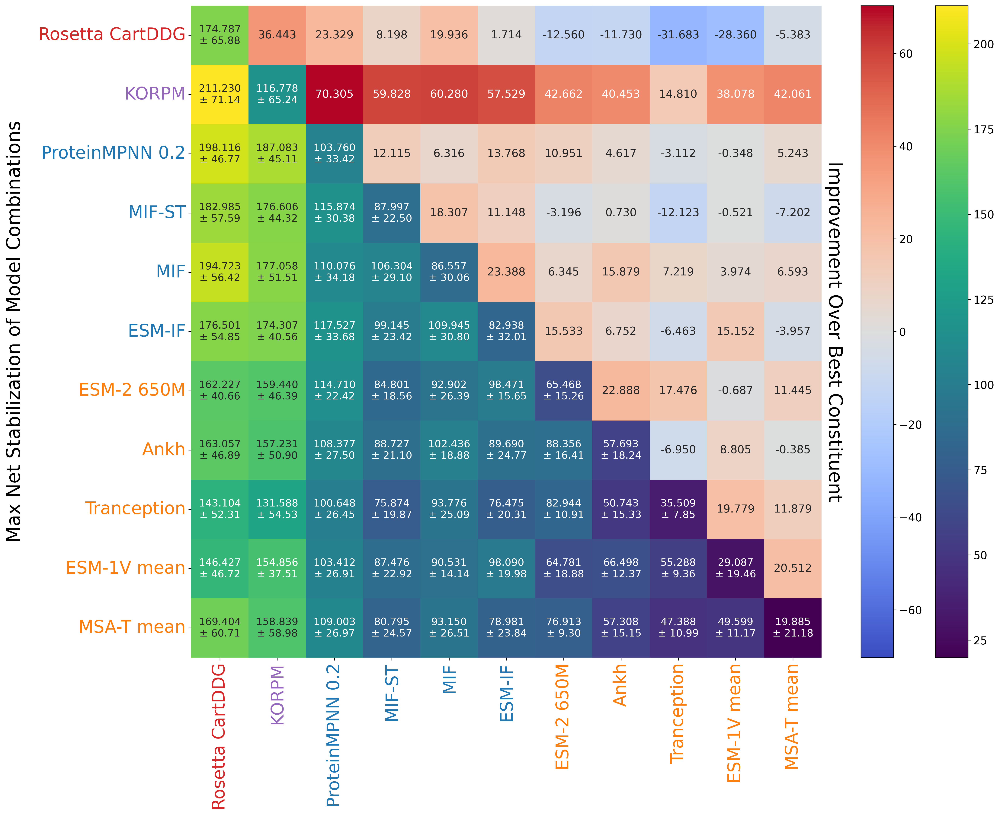

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,korpm_dir,0.5,211.23,0.000121
2,cartesian_ddg_dir,1,korpm_dir,0.2,207.944,0.000207
3,cartesian_ddg_dir,1,korpm_dir,1,201.141,0.000031
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,198.116,0.023772
5,cartesian_ddg_dir,1,mif_dir,0.2,194.723,0.014303


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=10, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df.head()

# ~ 10 seconds

### Supplementary Figure 8

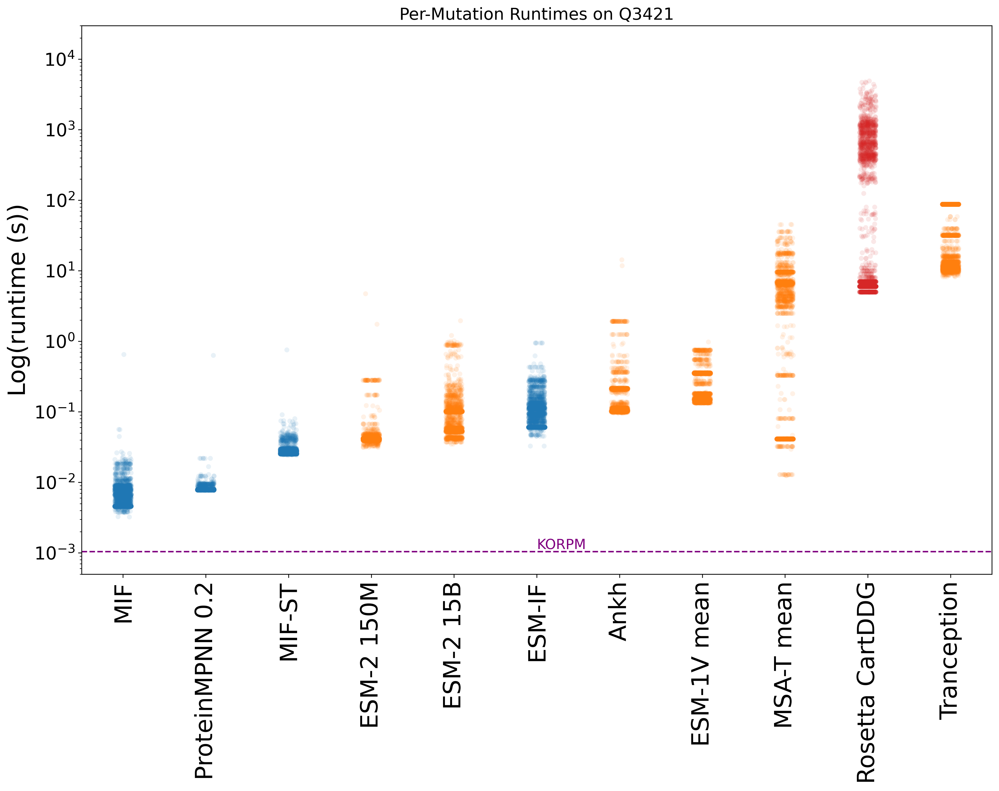

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

### Supplementary Figure 2

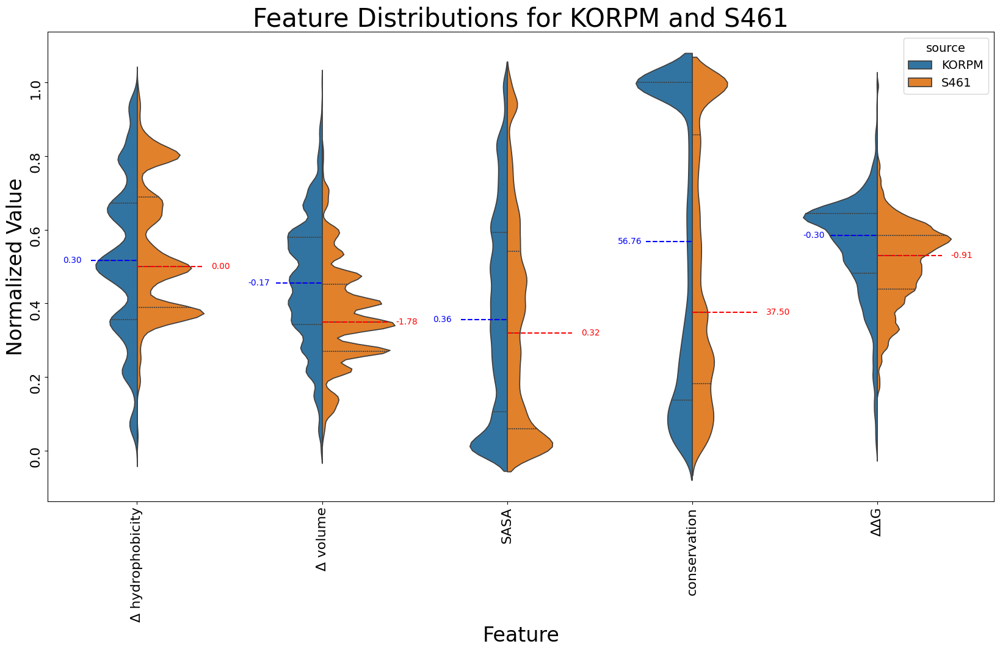

In [ ]:
importlib.reload(analysis_utils)
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_violin(db, s461_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'ddG'], source1='KORPM', label_adjust=0.1)